# Uncovering the Game Chat: A Topic Modeling Analysis of Apex Legends Discord Chats using LDA (Latent Dirchlet Allocation(LDA) ) and Naive Bayes Model 

**Submitted by**:
    
    Sathyam Gupta-2248015
    Prathana M-2248063
    Harsha KG-2248035

**Problem Statement**:

To identify the topics discussed in the Discord chat from the Apex Legends game server using LDA.

To analyze the sentiment of the chat messages using textblob and evaluate its accuracy through Naive Bayes classifier.

    

**Objective:**

We can use topic modeling to identify the main themes and topics being discussed in the
channel. This can help us understand the interests and preferences of the players and
tailor our content accordingly.

We can use clustering analysis to group similar messages together based on their content
or sentiment. This can help us identify sub-communities within the channel and
understand the different perspectives and opinions of players.

Overall, analyzing data from a gaming discussion channel in an Apex Legends server can
provide valuable insights into the behavior and preferences of human players. 

By understanding these patterns, we can improve the gaming experience for players and
create more engaging content that resonates with our target audience.

**About the data**:

Source: Discord Server

Game: Apex legend

Channel:Game_discussion




**Steps to extract data from discord channels**:

1) Join the discord server

2) Collect your user token

3) Insert the token in the discord extracter (https://github.com/Tyrrrz/DiscordChatExporter)

4) Select the channel we wish to extract the data from. In this case, we have selectedthe gaming discxussion channel from the Apex legends server.

5) Specify the type of file we want to extract the data into. Csv in this case

6) After a few minutes, the csv file is ready.



 **Dataset Description**

**Message ID**: This field is a unique identifier for each message sent in the channel. It is
important for identifying and tracking specific messages in the channel, and can be used
to group messages by topic or conversation. Message IDs can also be used to analyze
message length, frequency, and patterns over time.

**Author**: This field represents the username or display name of the user who sent the
message. It is important for identifying individual users and their messaging patterns
within the channel, and can be used to analyze the engagement level of specific users,
their posting frequency, and the sentiment of their messages.

**Content**: This field includes the text content of the message, including any links, emojis,
or other media. It is important for understanding the topics and themes of the channel,
and can be used to identify common keywords or topics, as well as the sentiment of the
conversation. Analyzing the length, tone, and content of messages can provide insights
into user behavior and engagement.

**Timestamp:** This field represents the date and time when the message was sent. It is
important for analyzing message frequency, patterns, and trends over time. By grouping
messages by time intervals (e.g. daily, weekly, monthly), analysts can identify peak activity
times and patterns in the conversation, as well as track the evolution of topics and
themes over time.



# Importing Modules & Reading Data
Getting the imports out of the way first.

In [1]:
!pip install emoji

In [2]:
import re
import emoji
import numpy as np
import pandas as pd
import plotly.express as px

import re
import csv
import nltk
#import spacy
import string
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt 


In [3]:
# Downloads
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [4]:
# Preprocessing libraries 
#import en_core_web_sm
from collections import Counter
from nltk.probability import FreqDist
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer 
from nltk.corpus import stopwords, wordnet  
from sklearn.feature_extraction.text import CountVectorizer   
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split, RandomizedSearchCV
import spacy

nlp = spacy.load('en_core_web_sm')

In [5]:
#for model part
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.cluster import KMeans
from textblob import TextBlob
import pandas as pd



## Reading the data

In [6]:
data = pd.read_csv("Apex_channel.csv")

In [7]:
data.shape

(117939, 6)

# Data Preparation
Turning the raw data we extracted into something better to work with.

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 117939 entries, 0 to 117938
Data columns (total 6 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   AuthorID     117939 non-null  int64 
 1   Author       117939 non-null  object
 2   Date         117939 non-null  object
 3   Content      115846 non-null  object
 4   Attachments  3497 non-null    object
 5   Reactions    1976 non-null    object
dtypes: int64(1), object(5)
memory usage: 5.4+ MB


## Anonymizing The Data
It's not ethical (and probably not even legal) to make the account names of the people in a dataset public without their permission, so we'll anonimize them first.

In [9]:
def anom_dict (names):
  anonymized = {}
  for index, name in enumerate(names.unique()):
    anonymized[name] = f"A{index + 1}"
  return anonymized

In [10]:
data.Author = data.Author.map(anom_dict(data.Author))

In [11]:
data.head()

,AuthorID,Author,Date,Content,Attachments,Reactions
0,476636047577710595,A1,04/04/2023 11:55 AM,wow,NaN,NaN
1,384734573424279553,A2,04/04/2023 11:55 AM,guh??,NaN,NaN
2,812305320289239073,A3,04/04/2023 11:55 AM,Hey guys,NaN,NaN
3,453632463571517471,A4,04/04/2023 11:55 AM,Oh its back,NaN,NaN
4,476636047577710595,A1,04/04/2023 11:55 AM,No,NaN,NaN


In [12]:
# Remove column name 'A'
data= data.drop(['AuthorID'], axis=1)

In [13]:
data.shape

(117939, 5)

# Check for duplicates

In [14]:
percentofduplicates = round((1-(data['Content'].nunique()/len(data['Content'])))*100,2)
print(percentofduplicates, '%')

19.64 %


# Remove duplicate rows

In [15]:

# dropping duplicate values
data.drop_duplicates(keep=False, inplace=True)

In [16]:
data.shape

(117278, 5)

In [17]:
data.describe()

,Author,Date,Content,Attachments,Reactions
count,117278,117278,115195,3497,1974
unique,1678,14970,94722,3497,635
top,A56,04/15/2023 3:09 AM,:HorizonSipGHOSTATO:,https://cdn.discordapp.com/attachments/1091605...,💀 (1)
freq,5918,35,801,1,194


In [18]:
data.describe(include=object)

,Author,Date,Content,Attachments,Reactions
count,117278,117278,115195,3497,1974
unique,1678,14970,94722,3497,635
top,A56,04/15/2023 3:09 AM,:HorizonSipGHOSTATO:,https://cdn.discordapp.com/attachments/1091605...,💀 (1)
freq,5918,35,801,1,194


## Basic Cleaning
The dataset came with missing values resulting from the bot's failed read of a few messages and also has the time column as a string, which we want as a datetime object.

Time is stored as an object, which drastically limits what we can do with it. To fix that, we'll be turning it into a datetime object.

In [19]:
data.Date = pd.to_datetime(data.Date)

In [20]:
data.head()

,Author,Date,Content,Attachments,Reactions
0,A1,2023-04-04 11:55:00,wow,NaN,NaN
1,A2,2023-04-04 11:55:00,guh??,NaN,NaN
2,A3,2023-04-04 11:55:00,Hey guys,NaN,NaN
3,A4,2023-04-04 11:55:00,Oh its back,NaN,NaN
4,A1,2023-04-04 11:55:00,No,NaN,NaN


In [21]:
data.isnull().sum()

Author              0
Date                0
Content          2083
Attachments    113781
Reactions      115304
dtype: int64

The missing values consist of messages the bot was unable to read, such as embeds and images. So let's replace it as no value

In [22]:
#data.dropna(inplace=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 117278 entries, 0 to 117938
Data columns (total 5 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   Author       117278 non-null  object        
 1   Date         117278 non-null  datetime64[ns]
 2   Content      115195 non-null  object        
 3   Attachments  3497 non-null    object        
 4   Reactions    1974 non-null    object        
dtypes: datetime64[ns](1), object(4)
memory usage: 5.4+ MB


In [23]:
#Replace nul values with values not specified

data["Content"].fillna("Not Captured", inplace = True)
 

In [24]:
data.head()

,Author,Date,Content,Attachments,Reactions
0,A1,2023-04-04 11:55:00,wow,NaN,NaN
1,A2,2023-04-04 11:55:00,guh??,NaN,NaN
2,A3,2023-04-04 11:55:00,Hey guys,NaN,NaN
3,A4,2023-04-04 11:55:00,Oh its back,NaN,NaN
4,A1,2023-04-04 11:55:00,No,NaN,NaN


In [25]:
#Replace nul values with values not specified

data.drop(data.columns[[3, 4]], axis=1, inplace=True)

In [26]:
data.head()

,Author,Date,Content
0,A1,2023-04-04 11:55:00,wow
1,A2,2023-04-04 11:55:00,guh??
2,A3,2023-04-04 11:55:00,Hey guys
3,A4,2023-04-04 11:55:00,Oh its back
4,A1,2023-04-04 11:55:00,No


In [27]:
# convert the date column to datetime format
data['Date'] = pd.to_datetime(data['Date'], format='%d-%m-%y %H:%M:%S')

# create separate columns for date and time
data['date'] = data['Date'].dt.date
data['time'] = data['Date'].dt.time

# print the updated DataFrame
data

,Author,Date,Content,date,time
0,A1,2023-04-04 11:55:00,wow,2023-04-04,11:55:00
1,A2,2023-04-04 11:55:00,guh??,2023-04-04,11:55:00
2,A3,2023-04-04 11:55:00,Hey guys,2023-04-04,11:55:00
3,A4,2023-04-04 11:55:00,Oh its back,2023-04-04,11:55:00
4,A1,2023-04-04 11:55:00,No,2023-04-04,11:55:00
...,...,...,...,...,...
117934,A269,2023-04-16 18:23:00,can somebody tell me what is making these boos...,2023-04-16,18:23:00
117935,A269,2023-04-16 18:23:00,I have never seen this many boosters in one day,2023-04-16,18:23:00
117936,A1677,2023-04-16 18:24:00,"Got it, probably I didn't play so long that ga...",2023-04-16,18:24:00
117937,A1678,2023-04-16 18:29:00,These 6 man teams are spoiling ranked,2023-04-16,18:29:00


In [28]:
#drop the original Date column\
# drop column 'B'
data = data.drop('Date', axis=1)

In [29]:
data.head()

,Author,Content,date,time
0,A1,wow,2023-04-04,11:55:00
1,A2,guh??,2023-04-04,11:55:00
2,A3,Hey guys,2023-04-04,11:55:00
3,A4,Oh its back,2023-04-04,11:55:00
4,A1,No,2023-04-04,11:55:00


In [30]:
data.shape

(117278, 4)


We have dealt with missing values and incorrect value types but we might still want to do a few changes to the dataframe to make getting info out of it easier.

# Extract hashtags

In [31]:
import re

def get_hashtags(Content):
    # find all hashtags using regular expression
    hashtags = re.findall(r'#\w+', Content)

    # return the list of hashtags
    return hashtags


In [32]:
# Apply the get_hashtags function to the "Content" column
data['Hashtags'] = data['Content'].apply(get_hashtags)

# Print the results
data['Hashtags']

0         []
1         []
2         []
3         []
4         []
          ..
117934    []
117935    []
117936    []
117937    []
117938    []
Name: Hashtags, Length: 117278, dtype: object

In [33]:
# get the count of each URL
Hashtags_counts = data['Hashtags'].value_counts()

# create DataFrame from counts
Hashtags_counts_df = pd.DataFrame({'Hashtags': Hashtags_counts.index, 'count': Hashtags_counts.values})

# print the DataFrame
print(Hashtags_counts_df)

           Hashtags   count
0                []  116944
1            [#lfg]      88
2              [#1]      45
3           [#apex]      33
4        [#general]      24
..              ...     ...
85          [#mate]       1
86  [#Justice4tion]       1
87      [#strategy]       1
88            [#79]       1
89           [#gid]       1

[90 rows x 2 columns]


In [34]:
# explode the column that contains lists into multiple rows
data = data.explode('Hashtags')

# get the unique values of the exploded column
unique_hashtags = data['Hashtags'].unique()

# print the unique hashtags
print("Unique Hashtags: ", unique_hashtags)

Unique Hashtags:  [nan '#in' '#general' '#freegd1' '#bringbackgd1' '#justiceforgd1'
 '#deletegeneraltoo' '#game' '#misc' '#TCG' '#Gacha' '#Misc' '#1'
 '#FreeGD1' '#2' '#Gen' '#server' '#lfg' '#0' '#rollertime' '#shiton'
 '#StayMad' '#cheater' '#18' '#8448' '#294814' '#deleted'
 '#BringBackKingsCanyonOrWorldsEdgeJerks' '#video' '#4' '#custom' '#roles'
 '#Nerf' '#apex' '#3' '#getyourmoneyup' '#12' '#help' '#1765' '#295125'
 '#8309' '#295158' '#5' '#146382' '#mod' '#derp' '#11554' '#1307' '#2264'
 '#18pred' '#mate' '#bringbackbridges' '#na' '#Justice4tion' '#strategy'
 '#79' '#JusticeForDilly' '#KeepWraithMid' '#63' '#62' '#21691' '#U'
 '#202F3' '#15' '#how' '#VED' '#1526' '#296013' '#341' '#13' '#60' '#22'
 '#228' '#6' '#alls' '#lesbian' '#crab' '#DISCORD4LYFE' '#money'
 '#buffCaustic' '#700' '#7th' '#4574' '#boycottworldsedgebackinrotation'
 '#1766' '#kai' '#nobadmics' '#thanksandplease' '#runedrop' '#legit'
 '#cashap' '#lol' '#roasted' '#saidwithcash' '#nomcdonaldswifi'
 '#noairplanemi

# Mentions

In [35]:
import re

def get_Mentions(Content):
    # find all hashtags using regular expression
    Mentions = re.findall(r'@\w+', Content)

    # return the list of hashtags
    return Mentions

In [36]:
# Apply the get_hashtags function to the "Content" column
data['Mentions'] = data['Content'].apply(get_Mentions)

# Print the results
data['Mentions']

0         []
1         []
2         []
3         []
4         []
          ..
117934    []
117935    []
117936    []
117937    []
117938    []
Name: Mentions, Length: 117295, dtype: object

In [37]:
# get the count of each URL
Mentions_counts = data['Mentions'].value_counts()

# create DataFrame from counts
Mentions_counts_df = pd.DataFrame({'Mentions': Mentions_counts.index, 'count': Mentions_counts.values})

# print the DataFrame
print(Mentions_counts_df)

               Mentions   count
0                    []  115904
1             [@Aphima]      53
2      [@ThanosOnDissy]      53
3               [@real]      52
4               [@King]      48
..                  ...     ...
314    [@SalamenceFury]       1
315  [@Asian_Gummybear]       1
316            [@Khena]       1
317      [@chimmychuck]       1
318     [@Marluistufai]       1

[319 rows x 2 columns]


In [38]:
# explode the column that contains lists into multiple rows
data = data.explode('Mentions')

# get the unique values of the exploded column
unique_Mentions = data['Mentions'].unique()

# print the unique hashtags
print("Unique Mentions: ", unique_Mentions)

Unique Mentions:  [nan '@Mull' '@StormBeast' '@mull' '@SpecificZod' '@GeoffComma' '@mommy'
 '@ThanosOnDissy' '@Glazinfrfr' '@Terrasoar' '@ghosts' '@Nightshade' '@vn'
 '@Liza' '@bee' '@everyone' '@Gododo' '@Adykka' '@ZwergLXIX' '@Rafflekake'
 '@Uno' '@ZorkFireStorm' '@bigbruh' '@Hela' '@Vortex' '@Lewis' '@Phoenix'
 '@King' '@Ja' '@Apricot' '@Sapphire' '@Bulletzone' '@comps' '@vektor'
 '@Jaseb' '@Rabid' '@chaos98b' '@vvs' '@CraZe' '@real' '@Swing'
 '@phatbewbiez' '@WraithiestWraith' '@delfi2858' '@TSM' '@desiposo'
 '@Djonezzz' '@yukii' '@Joey' '@Block' '@enderboy17' '@bread' '@chicken'
 '@honest' '@Haramune' '@wlweavski' '@Orobosajr' '@GeoffCommawhy' '@Kylra'
 '@Aphima' '@fbi' '@puerco' '@Carly' '@Heart' '@getting' '@Dudz' '@dilly'
 '@Kinetic' '@cupcake' '@indra' '@Boomy' '@g' '@ror' '@Deleted' '@Tin'
 '@playboicartifan16' '@Fleer' '@drastik1HPi' '@Maflingus' '@AblazeValk'
 '@matty' '@DédicaceÀalex' '@Vsco' '@Manga' '@DBean' '@athaza' '@Hero𖦹'
 '@savaroni' '@SomberEditz' '@Forge' '@Sabre

# URLS

In [39]:
import re

def get_Mentions(Content):
    # find all hashtags using regular expression
    Mentions = re.findall(r'@\w+', Content)

    # return the list of hashtags
    return Mentions

In [40]:
import re

def extract_urls(Content):
    # find all URLs using regular expression
    urls = re.findall(r'http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+', Content)

    # return the list of URLs
    return urls


In [41]:
data['Urls'] = data['Content'].apply(extract_urls)


In [42]:
# explode the column that contains lists into multiple rows
data = data.explode('Urls')

# get the unique values of the exploded column
unique_urls = data['Urls'].unique()

# print the unique hashtags
print("Unique Urls: ", unique_urls)

Unique Urls:  [nan
 'https://tenor.com/view/troll-trolldespair-despair-trollge-sad-gif-24333398'
 'https://tenor.com/view/heavy-weapons-guy-heavy-tf2-tf2heavy-tf2-team-fortress2-gif-24023019'
 'https://tenor.com/view/rain-chair-sad-gif-24080159'
 'https://tenor.com/view/thanos-you-will-cease-to-exist-infinity-war-snap-gif-11736794'
 'https://tenor.com/view/thanos-just-the-snap-avengers-infinity-war-gif-12393235'
 'https://tenor.com/view/thanos-memoji-gif-23490017'
 'https://tenor.com/view/british-malding-opinion-gif-22999436'
 'https://discord.com/channels/541484311354933258/1091605173203386429/1092700442603036673'
 'https://cdn.discordapp.com/attachments/542742664165195787/882646160613986444/dedchat.gif'
 'https://tenor.com/view/roland-library-of-ruina-reception-meme-please-take-a-shower-gif-25730701'
 'https://cdn.discordapp.com/attachments/975004393063743542/1092268658807545897/IMG_3045.jpg'
 'https://imgur.com/a/Ll9sxHa'
 'https://media.discordapp.net/attachments/541484311849730062

In [43]:
import re

def extract_urls(Content):
    # find all URLs using regular expression
    urls = re.findall(r'http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+', Content)
    
    # create a dictionary with URL counts
    url_counts = {}
    for url in urls:
        if url in url_counts:
            url_counts[url] += 1
        else:
            url_counts[url] = 1
    
    # return the dictionary of URL counts
    return url_counts


In [44]:
data['UrlCounts'] = data['Content'].apply(extract_urls)


In [45]:
data['UrlCounts']

0         {}
1         {}
2         {}
3         {}
4         {}
          ..
117934    {}
117935    {}
117936    {}
117937    {}
117938    {}
Name: UrlCounts, Length: 117330, dtype: object

In [46]:
# get the count of each URL
url_counts = data['Urls'].value_counts()

# create DataFrame from counts
url_counts_df = pd.DataFrame({'Urls': url_counts.index, 'Count': url_counts.values})

# print the DataFrame
url_counts_df

,Urls,Count
0,https://cdn.discordapp.com/attachments/5427426...,33
1,https://tenor.com/view/hug-love-hi-bye-cat-gif...,17
2,https://tenor.com/view/shannon-sharpe-v1-ultra...,16
3,https://tenor.com/view/gigachad-chad-gif-20773266,14
4,https://media.discordapp.net/attachments/10484...,14
...,...,...
913,https://streamable.com/eitxhb,1
914,https://www.distractify.com/p/trumbull-starbuc...,1
915,https://tenor.com/view/bocchi-bocchi-the-rock-...,1
916,https://tenor.com/view/spongebob-spongebob-squ...,1


# Remove url's , puntuations , mentions, numbers etc and also convert all letters in lower case

In [47]:
def clean(Content):
    #convert into lowercase
    Content = Content.lower()
    # remove mentions    
    Content = re.sub('@[\w]*','',Content)  
    
    # Remove url's
    Content = re.sub(r'https?:\/\/.*\/\w*', '', Content)
    
    # Remove hashtags
    Content = re.sub(r'#\w*', '', Content)    
    
    # Remove numbers
    Content = re.sub(r'\d+', '', Content)  
    
    # Remove punctuation
    Content = re.sub(r"[,.;':@#?!\&/$]+\ *", ' ', Content)
    
    # Remove that funny diamond
    Content = re.sub(r"U+FFFD ", ' ', Content)
    
    # Remove extra whitespace
    Content = re.sub(r'\s\s+', ' ', Content)
    
    # Remove space in front of tweet
    Content = Content.lstrip(' ')                        
    
    return Content

data['Content'] = data['Content'].apply(clean)
data['Content'] = data['Content'].apply(clean)

data.head()

,Author,Content,date,time,Hashtags,Mentions,Urls,UrlCounts
0,A1,wow,2023-04-04,11:55:00,NaN,NaN,NaN,{}
1,A2,guh,2023-04-04,11:55:00,NaN,NaN,NaN,{}
2,A3,hey guys,2023-04-04,11:55:00,NaN,NaN,NaN,{}
3,A4,oh its back,2023-04-04,11:55:00,NaN,NaN,NaN,{}
4,A1,no,2023-04-04,11:55:00,NaN,NaN,NaN,{}


# Remove Emojis

In [48]:
# define a regular expression pattern to match emojis
emoji_pattern = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags=re.UNICODE)

# define a function to remove emojis from a text string
def remove_emojis(text):
    return emoji_pattern.sub(r'', text)

# apply the remove_emojis() function to the "Content" column of the DataFrame
data['Content'] = data['Content'].apply(remove_emojis)

# print the updated DataFrame
data

,Author,Content,date,time,Hashtags,Mentions,Urls,UrlCounts
0,A1,wow,2023-04-04,11:55:00,NaN,NaN,NaN,{}
1,A2,guh,2023-04-04,11:55:00,NaN,NaN,NaN,{}
2,A3,hey guys,2023-04-04,11:55:00,NaN,NaN,NaN,{}
3,A4,oh its back,2023-04-04,11:55:00,NaN,NaN,NaN,{}
4,A1,no,2023-04-04,11:55:00,NaN,NaN,NaN,{}
...,...,...,...,...,...,...,...,...
117934,A269,can somebody tell me what is making these boos...,2023-04-16,18:23:00,NaN,NaN,NaN,{}
117935,A269,i have never seen this many boosters in one day,2023-04-16,18:23:00,NaN,NaN,NaN,{}
117936,A1677,got it probably i didn t play so long that gam...,2023-04-16,18:24:00,NaN,NaN,NaN,{}
117937,A1678,these man teams are spoiling ranked,2023-04-16,18:29:00,NaN,NaN,NaN,{}


# Create a copy of this data

In [49]:
data1=data.copy()

In [50]:
import nltk
nltk.download('omw-1.4')

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

# Lemmatization, POS tagging and Tokenization

In [51]:


# define a regular expression pattern to match emojis
emoji_pattern = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags=re.UNICODE)

# define a function to extract emojis from a text string
def extract_emojis(Content):
    return ''.join(emoji_pattern.findall(Content))

# apply the extract_emojis() function to the "Content" column of the DataFrame
data['Emojis'] = data['Content'].apply(extract_emojis)

# print the updated DataFrame
data


,Author,Content,date,time,Hashtags,Mentions,Urls,UrlCounts,Emojis
0,A1,wow,2023-04-04,11:55:00,NaN,NaN,NaN,{},
1,A2,guh,2023-04-04,11:55:00,NaN,NaN,NaN,{},
2,A3,hey guys,2023-04-04,11:55:00,NaN,NaN,NaN,{},
3,A4,oh its back,2023-04-04,11:55:00,NaN,NaN,NaN,{},
4,A1,no,2023-04-04,11:55:00,NaN,NaN,NaN,{},
...,...,...,...,...,...,...,...,...,...
117934,A269,can somebody tell me what is making these boos...,2023-04-16,18:23:00,NaN,NaN,NaN,{},
117935,A269,i have never seen this many boosters in one day,2023-04-16,18:23:00,NaN,NaN,NaN,{},
117936,A1677,got it probably i didn t play so long that gam...,2023-04-16,18:24:00,NaN,NaN,NaN,{},
117937,A1678,these man teams are spoiling ranked,2023-04-16,18:29:00,NaN,NaN,NaN,{},


In [52]:
import re

# define the regex pattern to match emojis
emoji_pattern = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags=re.UNICODE)

for i, row in data.iterrows():
    # get the content of the row
    Content = row['Content']
    # check if the last character is an emoji or space followed by emoji
    if len(Content) >= 2 and (emoji_pattern.search(Content[-1]) or emoji_pattern.search(Content[-2:])):
        # remove the last character if it's an emoji
        Content = Content[:-1].rstrip() if emoji_pattern.search(Content[-1]) else Content.rstrip()
        # update the content in the dataframe
        data.at[i, 'Content'] = Content


In [53]:
#df=pd.read_csv("preprocessed_data1.csv")

In [54]:
def lemma(data):
    data['length'] = data['Content'].str.len()
    data['tokenized'] = data['Content'].apply(word_tokenize)
    data['pos_tags'] = data['tokenized'].apply(nltk.tag.pos_tag)

    def get_wordnet_pos(tag):

        if tag.startswith('J'):
            return wordnet.ADJ

        elif tag.startswith('V'):
            return wordnet.VERB
        
        elif tag.startswith('N'):
            return wordnet.NOUN

        elif tag.startswith('R'):
            return wordnet.ADV
    
        else:
            return wordnet.NOUN
        
    wnl = WordNetLemmatizer()
    data['pos_tags'] = data['pos_tags'].apply(lambda x: [(word, get_wordnet_pos(pos_tag)) for (word, pos_tag) in x])
    data['lemmatized'] = data['pos_tags'].apply(lambda x: [wnl.lemmatize(word, tag) for word, tag in x])
    data['lemmatized'] = [' '.join(map(str, l)) for l in data['lemmatized']]  
    return data

data = lemma(data)
data.head(20)

,Author,Content,date,time,Hashtags,Mentions,Urls,UrlCounts,Emojis,length,tokenized,pos_tags,lemmatized
0,A1,wow,2023-04-04,11:55:00,NaN,NaN,NaN,{},,3,[wow],"[(wow, n)]",wow
1,A2,guh,2023-04-04,11:55:00,NaN,NaN,NaN,{},,4,[guh],"[(guh, n)]",guh
2,A3,hey guys,2023-04-04,11:55:00,NaN,NaN,NaN,{},,8,"[hey, guys]","[(hey, n), (guys, n)]",hey guy
3,A4,oh its back,2023-04-04,11:55:00,NaN,NaN,NaN,{},,11,"[oh, its, back]","[(oh, n), (its, n), (back, n)]",oh it back
4,A1,no,2023-04-04,11:55:00,NaN,NaN,NaN,{},,2,[no],"[(no, n)]",no
5,A5,forst,2023-04-04,11:55:00,NaN,NaN,NaN,{},,5,[forst],"[(forst, r)]",forst
6,A1,fuck you,2023-04-04,11:55:00,NaN,NaN,NaN,{},,8,"[fuck, you]","[(fuck, n), (you, n)]",fuck you
7,A1,you goy first message,2023-04-04,11:55:00,NaN,NaN,NaN,{},,21,"[you, goy, first, message]","[(you, n), (goy, v), (first, a), (message, n)]",you goy first message
8,A1,you,2023-04-04,11:55:00,NaN,NaN,NaN,{},,3,[you],"[(you, n)]",you
9,A4,trippin,2023-04-04,11:55:00,NaN,NaN,NaN,{},,7,[trippin],"[(trippin, n)]",trippin


# Remove Stop Word

In [55]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize


# Define the stop words
stop_words = set(stopwords.words('english'))

# Define a function to remove stop words
def remove_stopwords(text):
    # Tokenize text into words
    words = word_tokenize(text)
    # Remove stop words
    filtered_words = [word for word in words if word.lower() not in stop_words]
    # Join filtered words back into a sentence
    filtered_text = ' '.join(filtered_words)
    return filtered_text

# Apply the function to your lemmatized text column
data['lemmatized'] = data['lemmatized'].apply(remove_stopwords)




[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# Adding a Word Count Column

We can see the average length of a user's message by adding a column that keeps track of their word count per message.

Adding a new column that contains the word count for each message.


In [56]:
def word_count (lemmatized):
  return len(lemmatized.split())

In [57]:
words = data.Content.apply(word_count)
data.insert(13, "word_count", words)

In [58]:
data


,Author,Content,date,time,Hashtags,Mentions,Urls,UrlCounts,Emojis,length,tokenized,pos_tags,lemmatized,word_count
0,A1,wow,2023-04-04,11:55:00,NaN,NaN,NaN,{},,3,[wow],"[(wow, n)]",wow,1
1,A2,guh,2023-04-04,11:55:00,NaN,NaN,NaN,{},,4,[guh],"[(guh, n)]",guh,1
2,A3,hey guys,2023-04-04,11:55:00,NaN,NaN,NaN,{},,8,"[hey, guys]","[(hey, n), (guys, n)]",hey guy,2
3,A4,oh its back,2023-04-04,11:55:00,NaN,NaN,NaN,{},,11,"[oh, its, back]","[(oh, n), (its, n), (back, n)]",oh back,3
4,A1,no,2023-04-04,11:55:00,NaN,NaN,NaN,{},,2,[no],"[(no, n)]",,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117934,A269,can somebody tell me what is making these boos...,2023-04-16,18:23:00,NaN,NaN,NaN,{},,66,"[can, somebody, tell, me, what, is, making, th...","[(can, n), (somebody, n), (tell, v), (me, n), ...",somebody tell make booster boost even,12
117935,A269,i have never seen this many boosters in one day,2023-04-16,18:23:00,NaN,NaN,NaN,{},,47,"[i, have, never, seen, this, many, boosters, i...","[(i, n), (have, v), (never, r), (seen, v), (th...",never see many booster one day,10
117936,A1677,got it probably i didn t play so long that gam...,2023-04-16,18:24:00,NaN,NaN,NaN,{},,50,"[got, it, probably, i, didn, t, play, so, long...","[(got, v), (it, n), (probably, r), (i, v), (di...",get probably play long game ) ) ),11
117937,A1678,these man teams are spoiling ranked,2023-04-16,18:29:00,NaN,NaN,NaN,{},,35,"[these, man, teams, are, spoiling, ranked]","[(these, n), (man, n), (teams, n), (are, v), (...",man team spoil rank,6


# Word Frequencies

In [59]:
import nltk
from collections import Counter


In [60]:
data['lemmatized'] = data['lemmatized'].apply(nltk.word_tokenize)


In [61]:
tokens = [token for sublist in data['lemmatized'] for token in sublist]

In [62]:
word_freq = Counter(tokens)

In [63]:
word_freq = sorted(word_freq.items(), key=lambda x: x[1], reverse=True)

In [64]:
for word, freq in word_freq[:15]:
    print(f'{word}: {freq}')

get: 6487
like: 5104
’: 4795
play: 4026
game: 3272
good: 2983
u: 2380
im: 2353
go: 2157
one: 2133
capture: 2094
apex: 1948
bro: 1805
fuck: 1784
use: 1638


# Exploratory Data Analysis

# WordCloud Representation to visualize the maximum times each 'Hashtags' were used


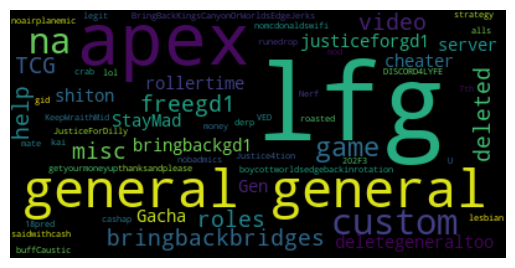

In [65]:
import pandas as pd
from wordcloud import WordCloud


# Remove null values from the column you want to use for the word cloud
column_without_nulls = data['Hashtags'].dropna()

# Generate the word cloud from the non-null values
wordcloud = WordCloud().generate(' '.join(column_without_nulls))

# Display the word cloud
import matplotlib.pyplot as plt
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

# **Visualizing the Top 10 frequent** **'Hashtags'**

<AxesSubplot:xlabel='Hashtags', ylabel='count'>

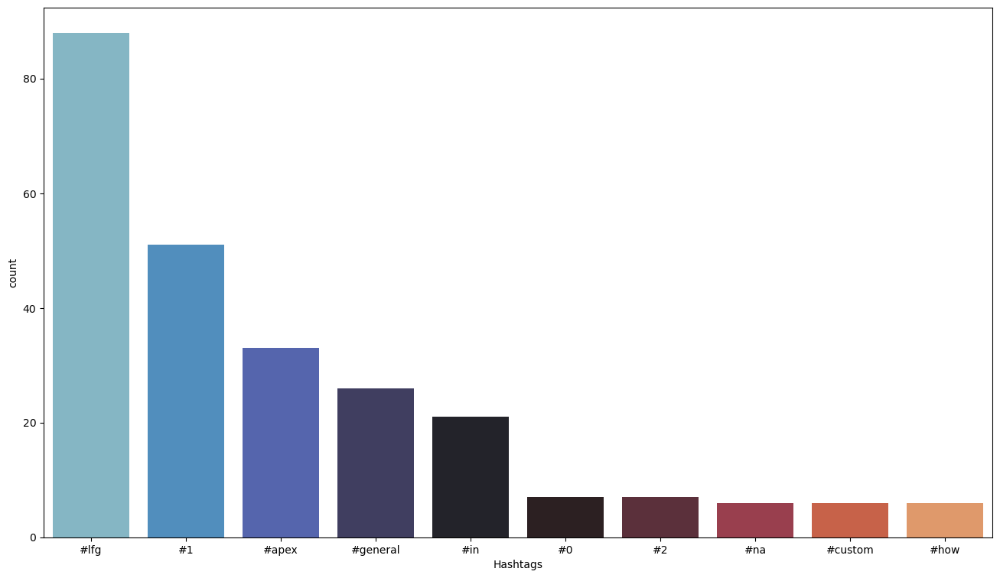

In [66]:
# Extract the column Mentions
col = data['Hashtags']

fig = plt.figure(figsize=(16,9))

# Count the occurrences of each unique element in column and sort in descending order
counts = col.value_counts().sort_values(ascending=False)

# Slice the top 10 elements from the sorted Series
top_10 = counts.iloc[:10]
# Plot the top 10 elements using Seaborn's countplot function
sns.countplot(x=col, order=top_10.index,palette="icefire")


# Visualizing the least 10 frequent 'Hashtags'


<AxesSubplot:xlabel='Hashtags', ylabel='count'>

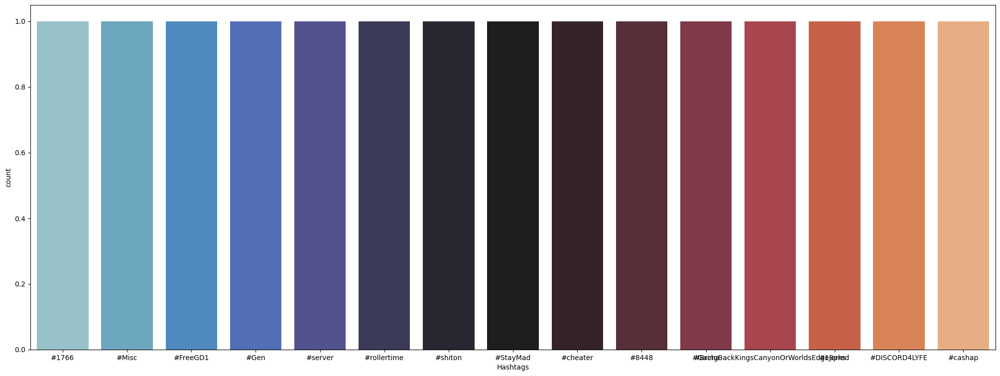

In [67]:
# Extract the column Mentions
col = data['Hashtags']

fig = plt.figure(figsize=(25,9))

# Count the occurrences of each unique element in column and sort in descending order
counts = col.value_counts().sort_values(ascending=True)

# Slice the top 10 elements from the sorted Series
top_10 = counts.iloc[:15]
# Plot the top 10 elements using Seaborn's countplot function
sns.countplot(x=col, order=top_10.index,palette="icefire")


# Word Cloud of Mentions

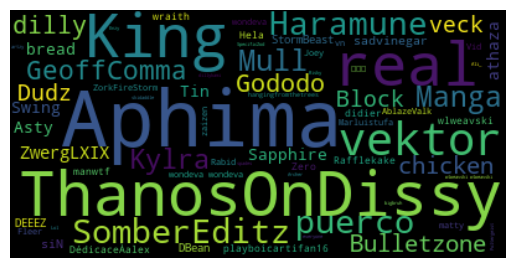

In [68]:
import pandas as pd
from wordcloud import WordCloud


# Remove null values from the column you want to use for the word cloud
column_without_nulls = data['Mentions'].dropna()

# Generate the word cloud from the non-null values
wordcloud = WordCloud().generate(' '.join(column_without_nulls))

# Display the word cloud
import matplotlib.pyplot as plt
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

# Visualizing the Top 10 frequent Mentions



<AxesSubplot:xlabel='Mentions', ylabel='count'>

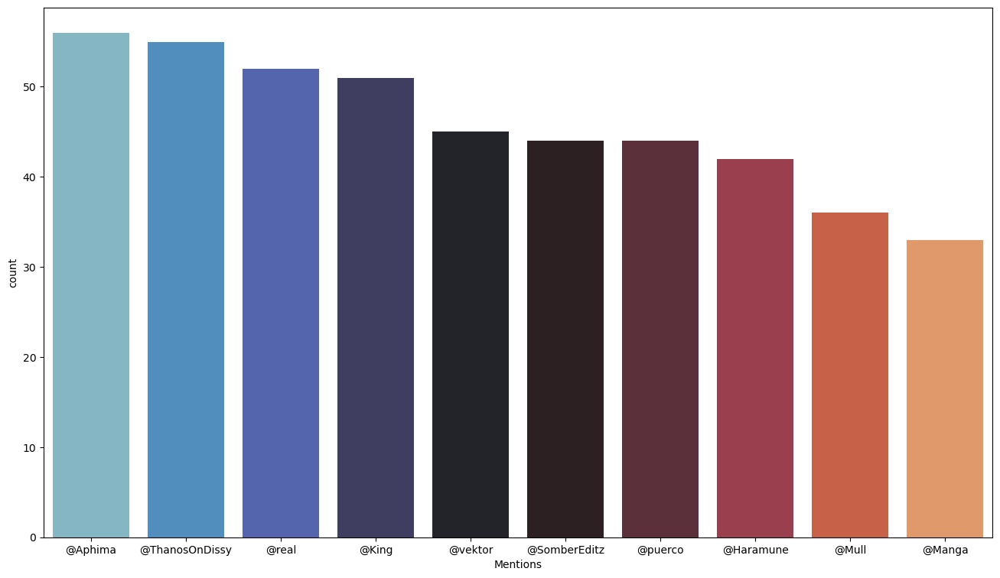

In [69]:
# Extract the column Mentions
col = data['Mentions']

fig = plt.figure(figsize=(16,9))

# Count the occurrences of each unique element in column and sort in descending order
counts = col.value_counts().sort_values(ascending=False)

# Slice the top 10 elements from the sorted Series
top_10 = counts.iloc[:10]
# Plot the top 10 elements using Seaborn's countplot function
sns.countplot(x=col, order=top_10.index,palette="icefire")


# Visualizing the least 20 frequent Mentions


<AxesSubplot:xlabel='Mentions', ylabel='count'>

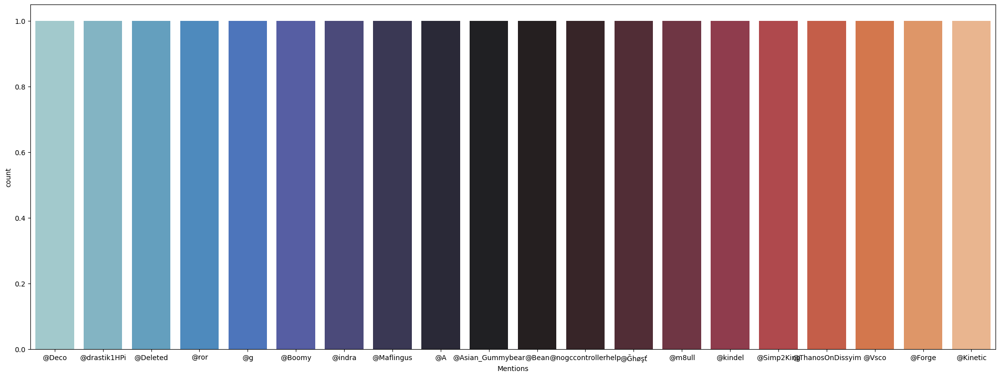

In [70]:
# Extract the column Mentions
col = data['Mentions']

fig = plt.figure(figsize=(25,9))

# Count the occurrences of each unique element in column and sort in descending order
counts = col.value_counts().sort_values(ascending=True)

# Slice the top 10 elements from the sorted Series
top_10 = counts.iloc[:20]
# Plot the top 10 elements using Seaborn's countplot function
sns.countplot(x=col, order=top_10.index,palette="icefire")

# Histogram to visualize the length of the text



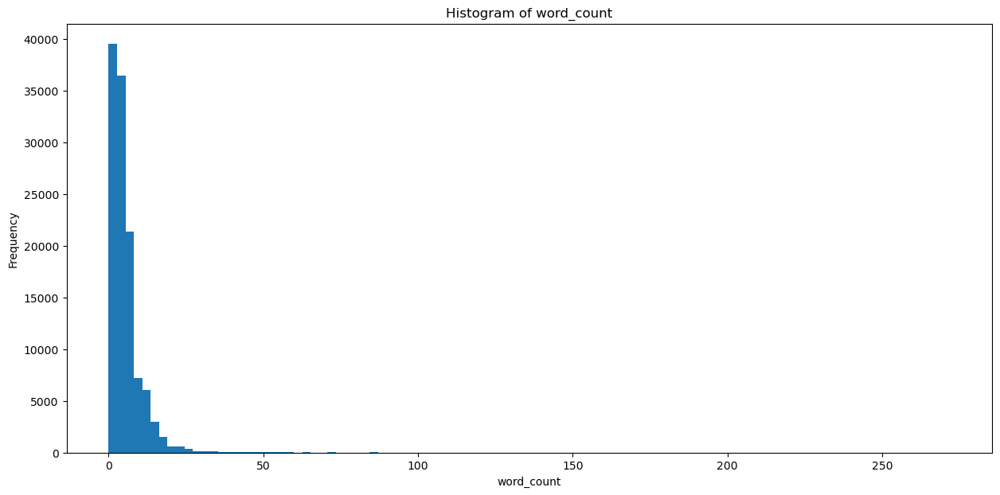

In [71]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 7))
# Create a histogram with 10 bins
plt.hist(data['word_count'], bins=100)

# Set the labels and title
plt.xlabel('word_count')
plt.ylabel('Frequency')
plt.title('Histogram of word_count')

# Display the histogram
plt.show()

# User Activity Over Time

Plotting the messages sent by the server members over the entire period covered by the dataset.

When we try to plot the user activity in the server, the plot gets visually crowded from the amount of authors there is. Most of which actually contribute very little to the data.


In [72]:
fig = px.histogram(data, x='date', color='Author', opacity=0.5)
fig.show()

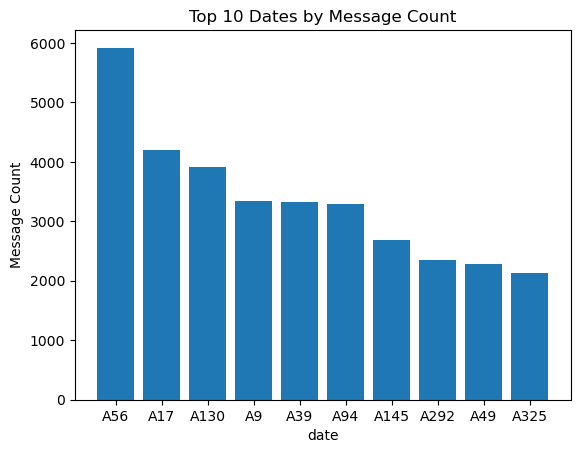

In [73]:
import matplotlib.pyplot as plt

# Get the top 10 authors by message count
top_authors = data['Author'].value_counts().head(10)

# Create the bar plot
plt.bar(top_authors.index, top_authors)

# Add labels and title
plt.xlabel('date')
plt.ylabel('Message Count')
plt.title('Top 10 Dates by Message Count')

# Show the plot
plt.show()

The reason for the presence of many authors who don't actually make a difference to the dataset is that the bot also reads messages sent from inactive users and bots alike, meaning the there's data that, despite not being NaN, is unnecessary to the overall analysis

In [74]:
fig = px.histogram(data, 
                   x='Author',
                   title='Messages Sent Per Author',
                   labels={'Author':'Author'})

fig.update_layout(title_font_size=30,
                  template='plotly_white')

fig.show()

Dropping all authors who have sent less messages than a minimum amount, we're filtering out those who don't significantly alter our data. You can execute the cell below and then the graph above again to see the difference for yourself

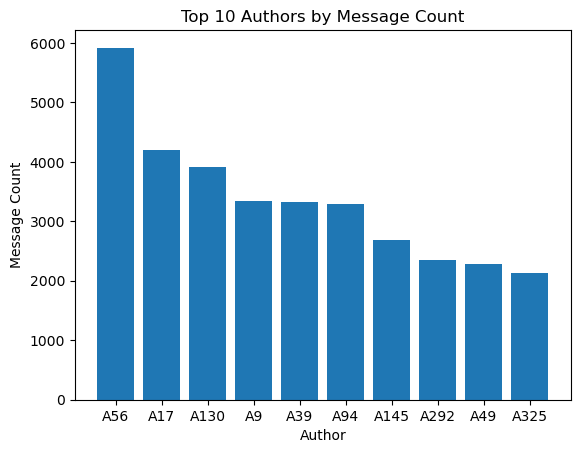

In [75]:
import matplotlib.pyplot as plt

# Get the top 10 authors by message count
top_authors = data['Author'].value_counts().head(10)

# Create the bar plot
plt.bar(top_authors.index, top_authors)

# Add labels and title
plt.xlabel('Author')
plt.ylabel('Message Count')
plt.title('Top 10 Authors by Message Count')

# Show the plot
plt.show()


# Remove the unwanted Columns

In [76]:
# Drop two or more columns by name
data = data.drop(['Hashtags','Mentions','Urls','UrlCounts','Emojis'], axis=1)

# Save the updated DataFrame to a new CSV file
data1= data.to_csv('cleaned_data_final.csv', index=False)


In [77]:
data.head()

,Author,Content,date,time,length,tokenized,pos_tags,lemmatized,word_count
0,A1,wow,2023-04-04,11:55:00,3,[wow],"[(wow, n)]",[wow],1
1,A2,guh,2023-04-04,11:55:00,4,[guh],"[(guh, n)]",[guh],1
2,A3,hey guys,2023-04-04,11:55:00,8,"[hey, guys]","[(hey, n), (guys, n)]","[hey, guy]",2
3,A4,oh its back,2023-04-04,11:55:00,11,"[oh, its, back]","[(oh, n), (its, n), (back, n)]","[oh, back]",3
4,A1,no,2023-04-04,11:55:00,2,[no],"[(no, n)]",[],1


# Model Building


We have LDA model that has already reduced the high-dimensional document-term matrix into a lower-dimensional document-topic matrix. 

In [78]:


# Create a document-term matrix using CountVectorizer
vectorizer = CountVectorizer(stop_words='english')
doc_word = vectorizer.fit_transform(data['Content'])




The purpose of creating a document-term matrix using CountVectorizer is to represent the text data in a numerical format that can be used for machine learning and natural language processing tasks such as topic modeling.

CountVectorizer is a technique used to convert a collection of text documents to a matrix of token counts. It essentially counts the frequency of each word (or n-gram) in each document, and creates a sparse matrix representation where each row represents a document and each column represents a unique word in the corpus.

The stop_words parameter in CountVectorizer is set to 'english', which tells the vectorizer to ignore common English stop words like 'the', 'and', 'a', etc. These words are usually not informative for analysis and can be safely removed.

Once we have the document-term matrix, we can apply various topic modeling techniques to uncover latent topics in the corpus.

# Feature Reduction using LDA

In [79]:
# Fit an LDA model with 5 topics
lda_model = LatentDirichletAllocation(n_components=3, random_state=42)
lda_model.fit(doc_word)



LatentDirichletAllocation(n_components=3, random_state=42)

In [80]:
# Extract the topic-word matrix and print the top 10 words for each topic
topic_word = lda_model.components_
for i, topic in enumerate(topic_word):
    print("Topic {}: {}".format(i, ", ".join([vectorizer.get_feature_names()[index] for index in topic.argsort()[:-11:-1]])))



Topic 0: like, captured, bro, fr, just, better, fuck, dont, got, horizonsipghostato
Topic 1: good, im, just, bad, yes, shit, oh, need, really, did
Topic 2: play, game, just, like, yeah, lol, people, got, think, fun


#    Inference

**Interpretation of each topic in Apex Legends game:**

**Topic 0 appears to be focused on casual conversation, using slang and profanity. It's likely a discussion between friends, with topics ranging from personal experiences to opinions and reactions. The words "like," "bro," "fr" (short for "for real"), "fuck," and "got" are frequently used, indicating an informal tone.**

**Topic 1 seems to be more about expressing emotions and opinions, with words such as "good," "bad," "im" (short for "I'm"), "yes," and "oh" indicating a more introspective and thoughtful discussion. It may include topics such as personal struggles, achievements, or reactions to events in the news or media.**

**Topic 2 revolves around gaming, with words such as "play," "game," "lol" (short for "laugh out loud"), and "fun" suggesting a discussion about favorite games, strategies, or experiences. It may also include debates about gaming culture or the industry in general.**

In [81]:
# Perform sentiment analysis on each row
# Join the list of lemmatized words into a single string
data['lemmatized'] = data['lemmatized'].apply(lambda x: ' '.join(x))



data['sentiment'] = data['lemmatized'].apply(lambda x: TextBlob(x).polarity)


# Classify sentiments as positive, negative, or neutral
data.loc[data['sentiment'] > 0, 'sentiment_class'] = 'positive'
data.loc[data['sentiment'] == 0, 'sentiment_class'] = 'neutral'
data.loc[data['sentiment'] < 0, 'sentiment_class'] = 'negative'

# Extract positive, negative, and neutral words
data['positive_words'] = data['Content'].apply(lambda x: ' '.join([word for word in x.split() if 
                                                                   TextBlob(word).sentiment.polarity > 0]))
data['negative_words'] = data['Content'].apply(lambda x: ' '.join([word for word in x.split() if
                                                                   TextBlob(word).sentiment.polarity < 0]))
data['neutral_words'] = data['Content'].apply(lambda x: ' '.join([word for word in x.split() if
                                                                  TextBlob(word).sentiment.polarity == 0]))

In [82]:
data.head()

,Author,Content,date,time,length,tokenized,pos_tags,lemmatized,word_count,sentiment,sentiment_class,positive_words,negative_words,neutral_words
0,A1,wow,2023-04-04,11:55:00,3,[wow],"[(wow, n)]",wow,1,0.1,positive,wow,,
1,A2,guh,2023-04-04,11:55:00,4,[guh],"[(guh, n)]",guh,1,0.0,neutral,,,guh
2,A3,hey guys,2023-04-04,11:55:00,8,"[hey, guys]","[(hey, n), (guys, n)]",hey guy,2,0.0,neutral,,,hey guys
3,A4,oh its back,2023-04-04,11:55:00,11,"[oh, its, back]","[(oh, n), (its, n), (back, n)]",oh back,3,0.0,neutral,,,oh its back
4,A1,no,2023-04-04,11:55:00,2,[no],"[(no, n)]",,1,0.0,neutral,,,no


In [83]:
data1=data.copy()

In [84]:
# Save the updated DataFrame to a new CSV file
data1.to_csv('cleaned_data1.csv', index=False)

In [85]:
unique_count = data['sentiment_class'].unique()
print("The number of unique values in the 'sentiment_class' column is:", unique_count)


The number of unique values in the 'sentiment_class' column is: ['positive' 'neutral' 'negative']


In [86]:
sentimental_class_counts = data["sentiment_class"].value_counts()
print(sentimental_class_counts)

neutral     78992
positive    20930
negative    17408
Name: sentiment_class, dtype: int64


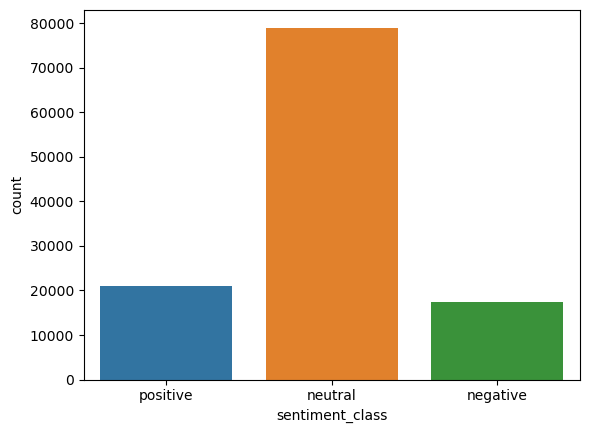

In [87]:
sentimental_class_counts = data["sentiment_class"].value_counts()

sns.countplot(x="sentiment_class", data=data)
plt.show()

# Naive Bayes Model

In [88]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data['lemmatized'], data['sentiment_class'], test_size=0.2, 
                                                    random_state=42)

# Create a bag-of-words representation of the text data
vectorizer = CountVectorizer()
X_train_counts = vectorizer.fit_transform(X_train)
X_test_counts = vectorizer.transform(X_test)

# Train a naive Bayes classifier on the training data
clf = MultinomialNB()
clf.fit(X_train_counts, y_train)

# Evaluate the performance of the classifier on the testing data
accuracy = clf.score(X_test_counts, y_test)


In [89]:
training_score= clf.score(X_train_counts, y_train)
print("Training score:",training_score)

Training score: 0.9819845734253814


In [90]:
testing_score= clf.score(X_test_counts, y_test)
print("Testing score:",testing_score)

Testing score: 0.9673996420352851


# Confusion matrix

In [92]:
from sklearn.metrics import confusion_matrix

# Use the trained classifier to predict the sentiment of the testing data
y_pred = clf.predict(X_test_counts)

# Generate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

cm


array([[ 3123,   173,   145],
       [   72, 15583,    96],
       [   97,   182,  3995]], dtype=int64)

Model has performed well overall, with high counts of true positives and true negatives and relatively low counts of false positives and false negatives.



# Classification Report

In [93]:
from sklearn.metrics import classification_report

# Use the trained classifier to predict the sentiment of the testing data
y_pred = clf.predict(X_test_counts)

# Generate the classification report
report = classification_report(y_test, y_pred)

print(report)

              precision    recall  f1-score   support

    negative       0.95      0.91      0.93      3441
     neutral       0.98      0.99      0.98     15751
    positive       0.94      0.93      0.94      4274

    accuracy                           0.97     23466
   macro avg       0.96      0.94      0.95     23466
weighted avg       0.97      0.97      0.97     23466



Classifier is performing very well, with high precision, recall, and F1-score for all three sentiment classes, and an overall accuracy of 0.97 on the testing data.

# Validating the model on a set of new  Random chats to identiy the nature of clusters

In [94]:
# Define the new chat messages
new_messages = ["hi!morning", "fuck!bad game", "play yaar", "what man", "lost-game", "good shot", "played well"]

In [95]:
import pandas as pd
import re

# Preprocess the new chat messages
import nltk
nltk.download('punkt')
nltk.download('wordnet')
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
new_messages_preprocessed = []
for message in new_messages:
    # Remove alphanumeric characters from the message
    message = re.sub(r'\W+', ' ', message)
    # Tokenize the message into words
    words = word_tokenize(message.lower())
    # Lemmatize each word to its base form
    lemmatized_words = [lemmatizer.lemmatize(word) for word in words]
    # Join the lemmatized words back into a single string
    lemmatized_message = " ".join(lemmatized_words)
    new_messages_preprocessed.append(lemmatized_message)

# Convert the preprocessed messages into a bag-of-words representation
new_messages_counts = vectorizer.transform(new_messages_preprocessed)



# Use the trained classifier to predict the sentiment of the new messages
new_messages_sentiments = clf.predict(new_messages_counts)

# Create a dataframe that contains the preprocessed messages and their predicted sentiments
data = {'Message': new_messages_preprocessed, 'Sentiment': new_messages_sentiments}
df = pd.DataFrame(data)

# Print the dataframe
df


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


,Message,Sentiment
0,hi morning,neutral
1,fuck bad game,negative
2,play yaar,neutral
3,what man,neutral
4,lost game,negative
5,good shot,positive
6,played well,neutral


In [97]:
# Save the updated DataFrame to a new CSV file
df= df.to_csv('Model_Validation_data.csv', index=False)

# Conclusion

Based on the topic modeling and clustering analysis, it seems that the conversations in the Apex Legends game chat server are diverse and cover a range of topics. The topics identified include frustration and negative experiences with the game, discussing gameplay mechanics and strategies, having fun while playing the game, discussing the game in general, and expressing emotions and reactions while playing the game.

Additionally, the clustering analysis revealed three distinct clusters, with one related to casual conversation or socializing, one related to negative sentiment or feedback related to the game, and one related to positive sentiment or feedback related to the game.

Overall, the analysis suggests that players in the Apex Legends game chat server engage in a variety of conversations and discussions related to the game, with both positive and negative sentiment expressed. These insights could be useful for game developers to understand player experiences and improve the game accordingly.